In [21]:
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt

from sklearn.preprocessing import StandardScaler, MinMaxScaler, LabelEncoder
from sklearn.model_selection import StratifiedKFold
from sklearn.metrics import classification_report, f1_score, roc_curve, auc, roc_auc_score
from sklearn.utils.class_weight import compute_class_weight
from sklearn.model_selection import cross_val_predict
from sklearn.metrics import confusion_matrix, ConfusionMatrixDisplay

from tensorflow.keras.models import Model
from tensorflow.keras.layers import Input, Dense
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.callbacks import EarlyStopping
from tensorflow.keras.utils import to_categorical

from tensorflow.keras.layers import Input, LSTM, Dense, Concatenate, BatchNormalization, Dropout
from tensorflow.keras.layers import GRU
from tensorflow.keras.layers import Conv1D, Flatten, GlobalAveragePooling1D

from tensorflow.keras.models import load_model #for checkpoints
from sklearn.metrics import accuracy_score

import timeit

In [23]:
#-------------- To visualise correlation of each column with others -------------------
def show_full_correlation_matrix(df):
    corr = df.corr()
    plt.figure(figsize=(20, 16))
    sns.heatmap(corr, cmap='coolwarm', annot=True, fmt='.2f', square=True,
                cbar_kws={"shrink": 0.75}, linewidths=0.5, linecolor='gray')
    plt.title("Full Feature Correlation Matrix", fontsize=18)
    plt.xticks(rotation=45, ha='right', fontsize=10)
    plt.yticks(rotation=0, fontsize=10)
    plt.tight_layout()
    plt.show()

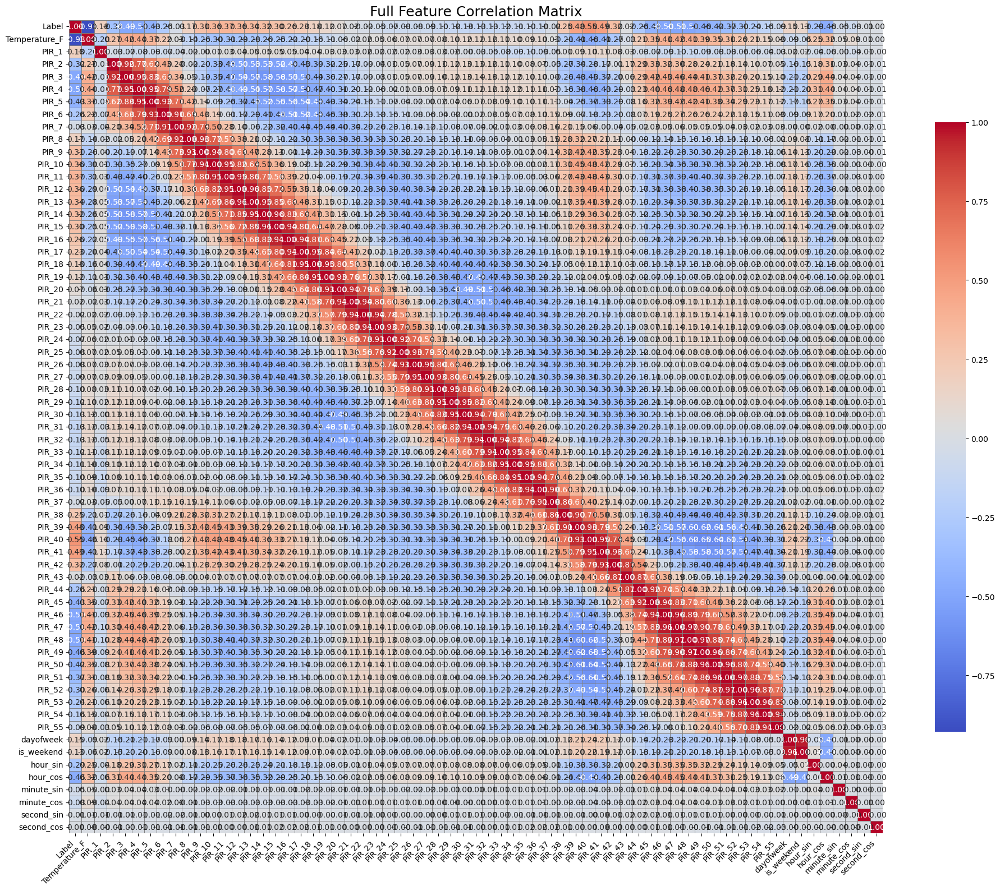

Found 55 PIR sensor columns
Metadata features: ['Temperature_F', 'dayofweek', 'is_weekend', 'hour_sin', 'hour_cos', 'minute_sin', 'minute_cos', 'second_sin', 'second_cos']

Class distribution: 0    6247
1     833
2     571
Name: count, dtype: int64
Number of classes: 3


In [25]:
#--------------- Loading and preprocessing data -------------------
df = pd.read_csv('pirvision_office_dataset1.csv')

# Processes Date and Time to produce meaningful cols for training
def process_datetime(df):
    # Combine Date and Time columns into one datetime column
    df['timestamp'] = pd.to_datetime(df['Date'] + ' ' + df['Time'])

    # Extract time-based features
    df['hour'] = df['timestamp'].dt.hour
    df['minute'] = df['timestamp'].dt.minute
    df['second'] = df['timestamp'].dt.second
    df['dayofweek'] = df['timestamp'].dt.dayofweek
    df['is_weekend'] = df['dayofweek'].isin([5, 6]).astype(int)

    # Cyclical encodings
    df['hour_sin'] = np.sin(2 * np.pi * df['hour'] / 24)
    df['hour_cos'] = np.cos(2 * np.pi * df['hour'] / 24)

    df['minute_sin'] = np.sin(2 * np.pi * df['minute'] / 60)
    df['minute_cos'] = np.cos(2 * np.pi * df['minute'] / 60)

    df['second_sin'] = np.sin(2 * np.pi * df['second'] / 60)
    df['second_cos'] = np.cos(2 * np.pi * df['second'] / 60)

    return df.drop(columns=['timestamp', 'Date', 'Time', 'hour', 'minute', 'second'])


df = process_datetime(df)
show_full_correlation_matrix(df)

# Identify PIR and Metadata Columns
pir_cols = [col for col in df.columns if col.startswith('PIR_')]  # Automatically finds all PIR columns
other_cols = [col for col in df.columns if col not in pir_cols + ['Label']]

print(f"Found {len(pir_cols)} PIR sensor columns")
print(f"Metadata features: {other_cols}")

# Scaling Features
scaler_pir = MinMaxScaler(feature_range=(0, 1))
df[pir_cols] = scaler_pir.fit_transform(df[pir_cols])

df = pd.get_dummies(df, columns=['dayofweek'], prefix='dow')

# Redefine meta columns after one-hot encoding
one_hot_cols = [col for col in df.columns if col.startswith('dow_')]

temp_scaler = StandardScaler()

# Fit and transform Temperature_F
df['Temperature_F'] = temp_scaler.fit_transform(df[['Temperature_F']])

continuous_meta_cols = ['Temperature_F', 'hour_sin', 'hour_cos',
                        'minute_sin', 'minute_cos',
                        'second_sin', 'second_cos', 'is_weekend']

meta_cols = continuous_meta_cols + one_hot_cols
other_cols = meta_cols  # Use this to extract X_meta later


# Prepare Inputs and Labels
X_pir = df[pir_cols].values.reshape(-1, len(pir_cols), 1)  # Sequential (samples, n_pir_sensors, 1)
X_meta = df[other_cols].values  # Non-sequential (samples, n_meta_features)
X_meta = df[other_cols].astype(np.float32).values

# Encode multi-class labels
le = LabelEncoder()
y = le.fit_transform(df['Label'])  # Convert string labels to integers if needed
num_classes = len(np.unique(y))
y_categorical = to_categorical(y)  # One-hot encoding

print(f"\nClass distribution: {pd.Series(y).value_counts()}")
print(f"Number of classes: {num_classes}")

# Class Weights because of imbalance in the given dataset
class_weights = compute_class_weight('balanced', classes=np.unique(y), y=y)
class_weights = dict(enumerate(class_weights))


In [26]:
#-------------------- Model Deciding --------------------
# Hybrid LSTM Model Builder (Multi-class)
def build_hybrid_model(pir_shape, meta_shape, num_classes):
    # Sequential input (PIR values)
    pir_input = Input(shape=pir_shape, name='pir_input')
    x = LSTM(64, return_sequences=True)(pir_input)
    x = BatchNormalization()(x)
    x = LSTM(32)(x)
    
    # Non-sequential input (metadata)
    meta_input = Input(shape=(meta_shape,), name='meta_input')
    y = Dense(32, activation='relu')(meta_input)
    y = BatchNormalization()(y)
    
    # Combine branches
    combined = Concatenate()([x, y])
    z = Dense(64, activation='relu')(combined)
    z = Dropout(0.3)(z)
    output = Dense(num_classes, activation='softmax')(z)  # Multi-class output
    
    model = Model(inputs=[pir_input, meta_input], outputs=output)
    model.compile(
        optimizer=Adam(0.005),
        loss='categorical_crossentropy',
        metrics=['accuracy']
    )
    return model
    
'''
# Hybrid GRU Model Builder (Multi-class)
def build_hybrid_model(pir_shape, meta_shape, num_classes):
    # Sequential input (PIR values)
    pir_input = Input(shape=pir_shape, name='pir_input')
    x = GRU(64, return_sequences=True)(pir_input)
    x = BatchNormalization()(x)
    x = GRU(32)(x)
    
    # Non-sequential input (metadata)
    meta_input = Input(shape=(meta_shape,), name='meta_input')
    y = Dense(32, activation='relu')(meta_input)
    y = BatchNormalization()(y)
    
    # Combine branches
    combined = Concatenate()([x, y])
    z = Dense(64, activation='relu')(combined)
    z = Dropout(0.3)(z)
    output = Dense(num_classes, activation='softmax')(z)  # Multi-class output
    
    model = Model(inputs=[pir_input, meta_input], outputs=output)
    model.compile(
        optimizer=Adam(0.005),
        loss='categorical_crossentropy',
        metrics=['accuracy']
    )
    return model


# Hybrid 1D-CNN(1D kernel) Model Builder (Multi-class)
def build_hybrid_model(pir_shape, meta_shape, num_classes):
    # Sequential input (PIR values)
    pir_input = Input(shape=pir_shape, name='pir_input')
    x = Conv1D(filters=64, kernel_size=7, activation='relu', padding='same')(pir_input)
    x = BatchNormalization()(x)
    x = Conv1D(filters=32, kernel_size=7, activation='relu', padding='same')(x)
    x = GlobalAveragePooling1D()(x)  # Reduces over time axis

    # Non-sequential input (metadata)
    meta_input = Input(shape=(meta_shape,), name='meta_input')
    y = Dense(32, activation='relu')(meta_input)
    y = BatchNormalization()(y)

    # Combine branches
    combined = Concatenate()([x, y])
    z = Dense(64, activation='relu')(combined)
    z = Dropout(0.3)(z)
    output = Dense(num_classes, activation='softmax')(z)

    model = Model(inputs=[pir_input, meta_input], outputs=output)
    model.compile(
        optimizer=Adam(0.005),
        loss='categorical_crossentropy',
        metrics=['accuracy']
    )
    return model
'''

"\n# Hybrid GRU Model Builder (Multi-class)\ndef build_hybrid_model(pir_shape, meta_shape, num_classes):\n    # Sequential input (PIR values)\n    pir_input = Input(shape=pir_shape, name='pir_input')\n    x = GRU(64, return_sequences=True)(pir_input)\n    x = BatchNormalization()(x)\n    x = GRU(32)(x)\n    \n    # Non-sequential input (metadata)\n    meta_input = Input(shape=(meta_shape,), name='meta_input')\n    y = Dense(32, activation='relu')(meta_input)\n    y = BatchNormalization()(y)\n    \n    # Combine branches\n    combined = Concatenate()([x, y])\n    z = Dense(64, activation='relu')(combined)\n    z = Dropout(0.3)(z)\n    output = Dense(num_classes, activation='softmax')(z)  # Multi-class output\n    \n    model = Model(inputs=[pir_input, meta_input], outputs=output)\n    model.compile(\n        optimizer=Adam(0.005),\n        loss='categorical_crossentropy',\n        metrics=['accuracy']\n    )\n    return model\n\n\n# Hybrid 1D-CNN(1D kernel) Model Builder (Multi-class)\n


Fold 1
Epoch 1/50
96/96 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - accuracy: 0.7698 - loss: 0.3724 - val_accuracy: 0.8922 - val_loss: 0.2123
Epoch 2/50
96/96 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - accuracy: 0.8880 - loss: 0.1510 - val_accuracy: 0.9504 - val_loss: 0.1449
Epoch 3/50
96/96 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - accuracy: 0.9034 - loss: 0.1532 - val_accuracy: 0.8772 - val_loss: 0.2545
Epoch 4/50
96/96 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - accuracy: 0.9097 - loss: 0.1392 - val_accuracy: 0.9321 - val_loss: 0.1348
Epoch 5/50
96/96 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - accuracy: 0.9395 - loss: 0.1012 - val_accuracy: 0.9438 - val_loss: 0.1228
Epoch 6/50
96/96 ━━━━━━━━━━━━━━━━━━━━ 2s 20ms/step - accuracy: 0.9334 - loss: 0.0968 - val_accuracy: 0.9288 - val_loss: 0.1664
Epoch 7/50
96/96 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - accuracy: 0.9489 - loss: 0.0934 - val_accuracy: 0.9726 - val_loss: 0.0699
Epoch 8/50
96/96 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - accuracy: 0.9558 - loss: 0.0768 - val_accuracy: 0.

48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step


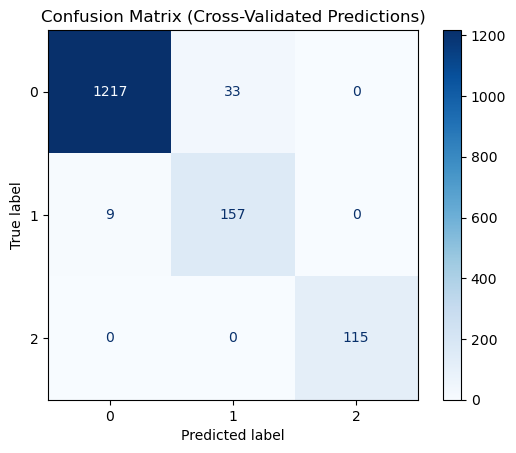


Classification Report (Fold 1):
              precision    recall  f1-score   support

           0       0.99      0.97      0.98      1250
           1       0.83      0.95      0.88       166
           3       1.00      1.00      1.00       115

    accuracy                           0.97      1531
   macro avg       0.94      0.97      0.96      1531
weighted avg       0.98      0.97      0.97      1531



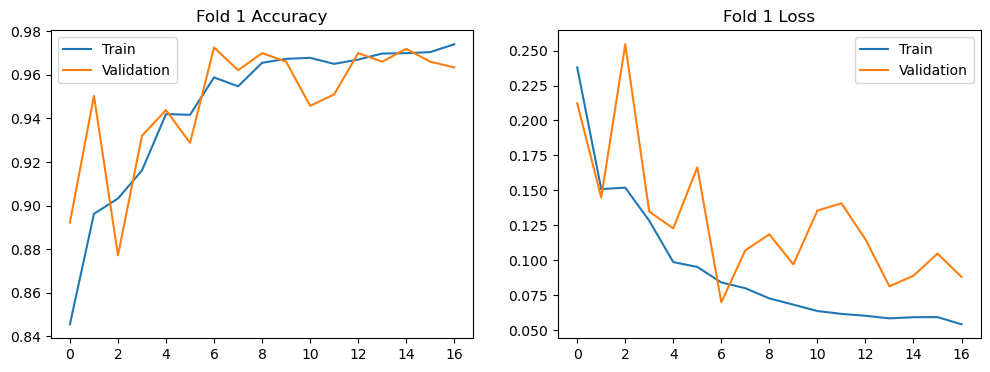


Fold 2
Epoch 1/50
96/96 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - accuracy: 0.8083 - loss: 0.3928 - val_accuracy: 0.9163 - val_loss: 0.2299
Epoch 2/50
96/96 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - accuracy: 0.9286 - loss: 0.1326 - val_accuracy: 0.8706 - val_loss: 0.2619
Epoch 3/50
96/96 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - accuracy: 0.9215 - loss: 0.1269 - val_accuracy: 0.9542 - val_loss: 0.1603
Epoch 4/50
96/96 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - accuracy: 0.9458 - loss: 0.1022 - val_accuracy: 0.9608 - val_loss: 0.1229
Epoch 5/50
96/96 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - accuracy: 0.9591 - loss: 0.0866 - val_accuracy: 0.9458 - val_loss: 0.1261
Epoch 6/50
96/96 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - accuracy: 0.9635 - loss: 0.0735 - val_accuracy: 0.9065 - val_loss: 0.2188
Epoch 7/50
96/96 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - accuracy: 0.9567 - loss: 0.0785 - val_accuracy: 0.9569 - val_loss: 0.1327
Epoch 8/50
96/96 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - accuracy: 0.9592 - loss: 0.0743 - val_accuracy: 0.

48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step


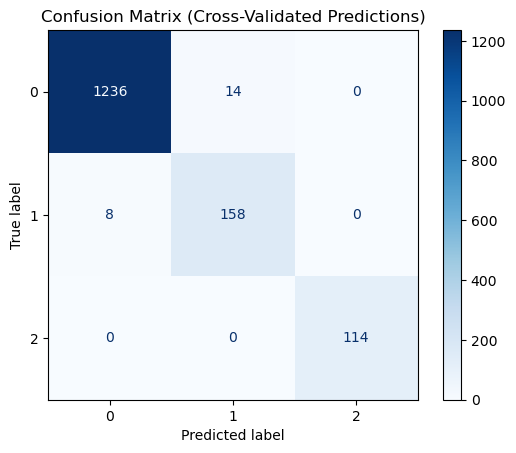


Classification Report (Fold 2):
              precision    recall  f1-score   support

           0       0.99      0.99      0.99      1250
           1       0.92      0.95      0.93       166
           3       1.00      1.00      1.00       114

    accuracy                           0.99      1530
   macro avg       0.97      0.98      0.98      1530
weighted avg       0.99      0.99      0.99      1530



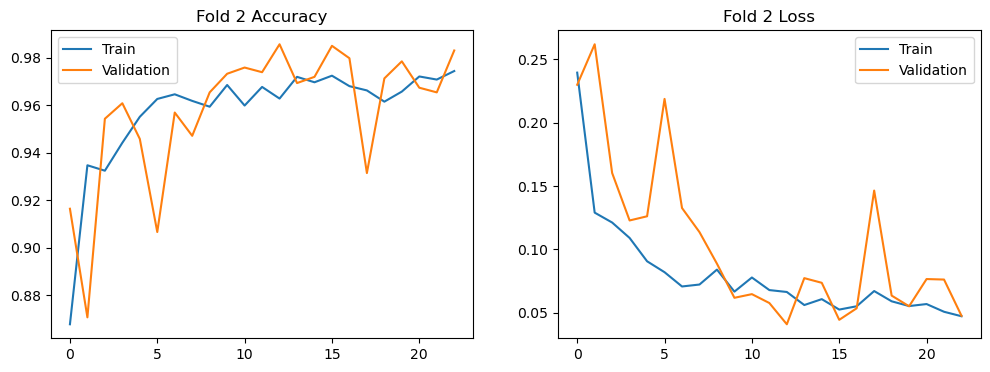


Fold 3
Epoch 1/50
96/96 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - accuracy: 0.7521 - loss: 0.3900 - val_accuracy: 0.4647 - val_loss: 1.0336
Epoch 2/50
96/96 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - accuracy: 0.9604 - loss: 0.0710 - val_accuracy: 0.4908 - val_loss: 1.0254
Epoch 3/50
96/96 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - accuracy: 0.9653 - loss: 0.0598 - val_accuracy: 0.3052 - val_loss: 1.8510
Epoch 4/50
96/96 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - accuracy: 0.9699 - loss: 0.0593 - val_accuracy: 0.3399 - val_loss: 1.9430
Epoch 5/50
96/96 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - accuracy: 0.9741 - loss: 0.0480 - val_accuracy: 0.8908 - val_loss: 0.5452
Epoch 6/50
96/96 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - accuracy: 0.9669 - loss: 0.0595 - val_accuracy: 0.9824 - val_loss: 0.0747
Epoch 7/50
96/96 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - accuracy: 0.9714 - loss: 0.0732 - val_accuracy: 0.9569 - val_loss: 0.0942
Epoch 8/50
96/96 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - accuracy: 0.9677 - loss: 0.0601 - val_accuracy: 0.

48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step


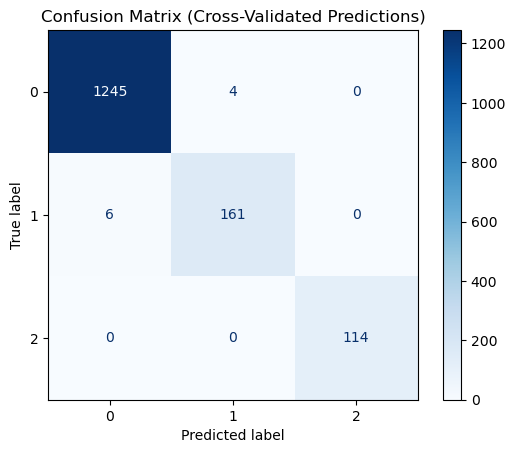


Classification Report (Fold 3):
              precision    recall  f1-score   support

           0       1.00      1.00      1.00      1249
           1       0.98      0.96      0.97       167
           3       1.00      1.00      1.00       114

    accuracy                           0.99      1530
   macro avg       0.99      0.99      0.99      1530
weighted avg       0.99      0.99      0.99      1530



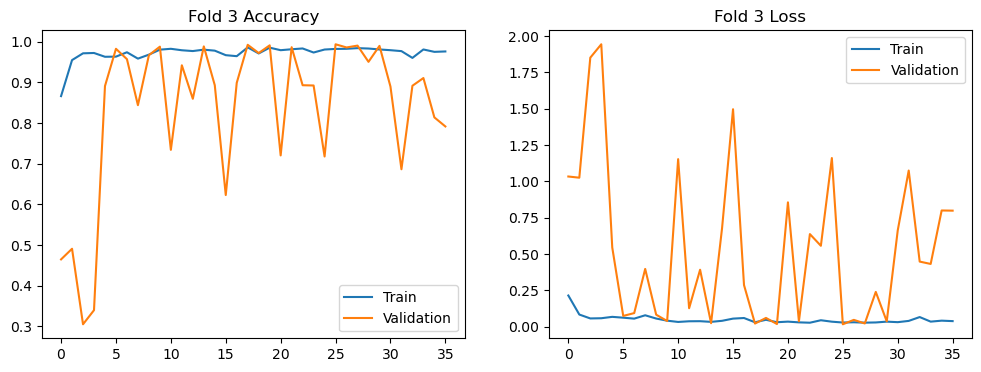


Fold 4
Epoch 1/50
96/96 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - accuracy: 0.7863 - loss: 0.3419 - val_accuracy: 0.8908 - val_loss: 0.1942
Epoch 2/50
96/96 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - accuracy: 0.8787 - loss: 0.1925 - val_accuracy: 0.9425 - val_loss: 0.1513
Epoch 3/50
96/96 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - accuracy: 0.9153 - loss: 0.1422 - val_accuracy: 0.9301 - val_loss: 0.1550
Epoch 4/50
96/96 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - accuracy: 0.9186 - loss: 0.1201 - val_accuracy: 0.9418 - val_loss: 0.1339
Epoch 5/50
96/96 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - accuracy: 0.9296 - loss: 0.1051 - val_accuracy: 0.9497 - val_loss: 0.1435
Epoch 6/50
96/96 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - accuracy: 0.9499 - loss: 0.0991 - val_accuracy: 0.9614 - val_loss: 0.1170
Epoch 7/50
96/96 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - accuracy: 0.9498 - loss: 0.0838 - val_accuracy: 0.9771 - val_loss: 0.0788
Epoch 8/50
96/96 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - accuracy: 0.9664 - loss: 0.0619 - val_accuracy: 0.

48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step


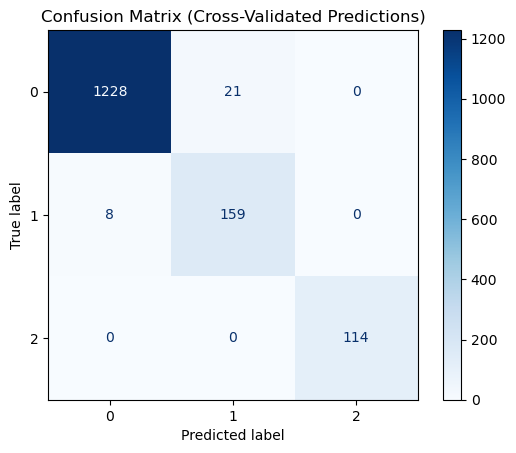


Classification Report (Fold 4):
              precision    recall  f1-score   support

           0       0.99      0.98      0.99      1249
           1       0.88      0.95      0.92       167
           3       1.00      1.00      1.00       114

    accuracy                           0.98      1530
   macro avg       0.96      0.98      0.97      1530
weighted avg       0.98      0.98      0.98      1530



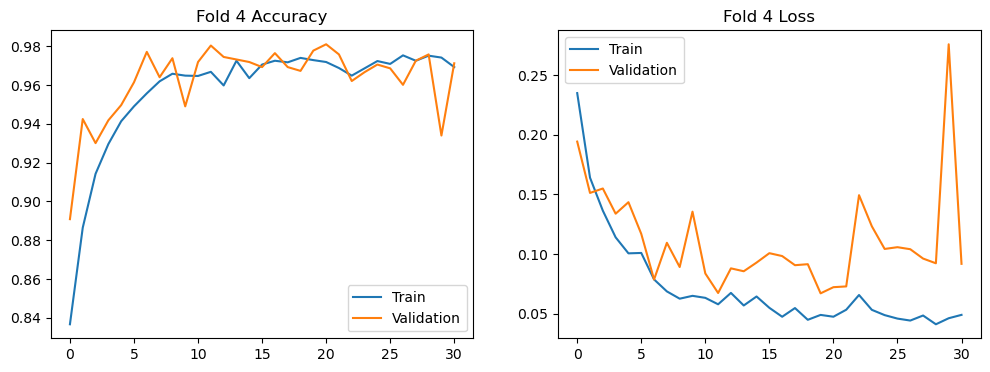


Fold 5
Epoch 1/50
96/96 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - accuracy: 0.7456 - loss: 0.3967 - val_accuracy: 0.8902 - val_loss: 0.2019
Epoch 2/50
96/96 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - accuracy: 0.8915 - loss: 0.1609 - val_accuracy: 0.9261 - val_loss: 0.1745
Epoch 3/50
96/96 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - accuracy: 0.9198 - loss: 0.1184 - val_accuracy: 0.9680 - val_loss: 0.1287
Epoch 4/50
96/96 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - accuracy: 0.9513 - loss: 0.0992 - val_accuracy: 0.9373 - val_loss: 0.1637
Epoch 5/50
96/96 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - accuracy: 0.9383 - loss: 0.1036 - val_accuracy: 0.9771 - val_loss: 0.0939
Epoch 6/50
96/96 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - accuracy: 0.9636 - loss: 0.0841 - val_accuracy: 0.9608 - val_loss: 0.1383
Epoch 7/50
96/96 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - accuracy: 0.9671 - loss: 0.0704 - val_accuracy: 0.9588 - val_loss: 0.1179
Epoch 8/50
96/96 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - accuracy: 0.9618 - loss: 0.0732 - val_accuracy: 0.

48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step


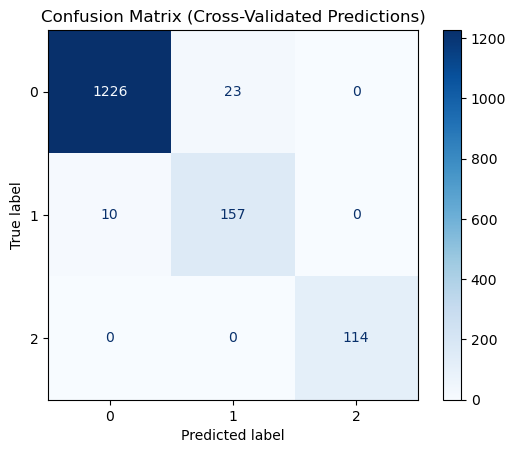


Classification Report (Fold 5):
              precision    recall  f1-score   support

           0       0.99      0.98      0.99      1249
           1       0.87      0.94      0.90       167
           3       1.00      1.00      1.00       114

    accuracy                           0.98      1530
   macro avg       0.95      0.97      0.96      1530
weighted avg       0.98      0.98      0.98      1530



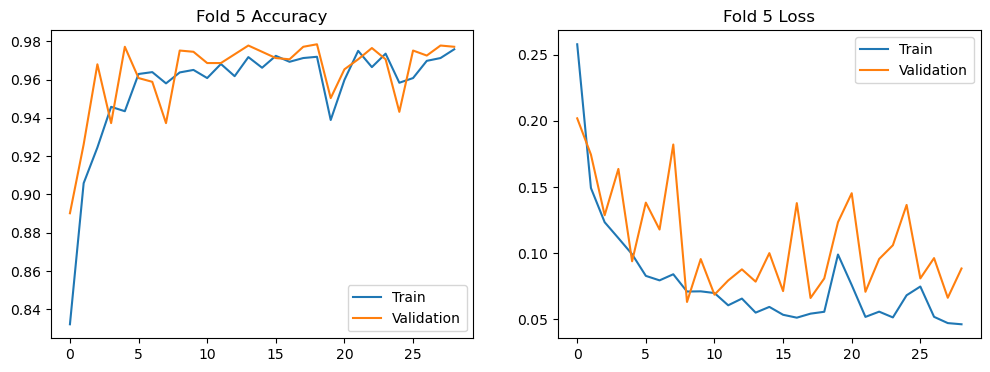


Final Cross-Validation Results:
Mean Accuracy: 0.9373 (±0.0732)
Mean Weighted F1: 0.9825 (±0.0068)
Mean Macro F1: 0.9702 (±0.0113)

Total time taken to train (all folds): 282.83003820800513):


In [29]:
#------------------------- Model Training -----------------------------
# 7. 5-Fold Cross Validation
skf = StratifiedKFold(n_splits=5, shuffle=True, random_state=42)
fold_metrics = {'accuracy': [], 'f1_weighted': [], 'f1_macro': []}

start_time = timeit.default_timer()

for fold, (train_idx, val_idx) in enumerate(skf.split(X_pir, y)):
    print(f"\nFold {fold + 1}")
    
    # Split data
    X_pir_train, X_pir_val = X_pir[train_idx], X_pir[val_idx]
    X_meta_train, X_meta_val = X_meta[train_idx], X_meta[val_idx]
    y_train, y_val = y_categorical[train_idx], y[val_idx]  # y_val kept as integers for evaluation
    
    # Build and train model
    model = build_hybrid_model(
        pir_shape=(X_pir.shape[1], X_pir.shape[2]),
        meta_shape=X_meta.shape[1],
        num_classes=num_classes
    )
    
    history = model.fit(
        [X_pir_train, X_meta_train], y_train,
        validation_data=([X_pir_val, X_meta_val], to_categorical(y_val)),
        epochs=50,
        batch_size=64,
        class_weight=class_weights,
        callbacks=[EarlyStopping(patience=10, restore_best_weights=True, monitor='val_accuracy')],
        verbose=1
    )

    model.save(f"checkpoints/team_36_fold{fold + 1}_model.h5")
    
    # Evaluate
    y_pred = np.argmax(model.predict([X_pir_val, X_meta_val]), axis=1)

    # Generate confusion matrix
    cm = confusion_matrix(y_val, y_pred)
    disp = ConfusionMatrixDisplay(confusion_matrix=cm)
    disp.plot(cmap=plt.cm.Blues)
    plt.title("Confusion Matrix (Cross-Validated Predictions)")
    plt.show()
    
    fold_metrics['accuracy'].append(history.history['val_accuracy'][-1])
    fold_metrics['f1_weighted'].append(f1_score(y_val, y_pred, average='weighted'))
    fold_metrics['f1_macro'].append(f1_score(y_val, y_pred, average='macro'))
    
    # Classification report
    print(f"\nClassification Report (Fold {fold+1}):")
    #print(classification_report(y_val, y_pred, target_names=le.classes_))
    print(classification_report(y_val, y_pred, target_names=[str(c) for c in le.classes_]))

    
    # Plot training history
    plt.figure(figsize=(12, 4))
    plt.subplot(1, 2, 1)
    plt.plot(history.history['accuracy'], label='Train')
    plt.plot(history.history['val_accuracy'], label='Validation')
    plt.title(f'Fold {fold+1} Accuracy')
    plt.legend()
    
    plt.subplot(1, 2, 2)
    plt.plot(history.history['loss'], label='Train')
    plt.plot(history.history['val_loss'], label='Validation')
    plt.title(f'Fold {fold+1} Loss')
    plt.legend()
    plt.show()

elapsed = timeit.default_timer() - start_time
# 8. Print CV Results
print("\nFinal Cross-Validation Results:")
print(f"Mean Accuracy: {np.mean(fold_metrics['accuracy']):.4f} (±{np.std(fold_metrics['accuracy']):.4f})")
print(f"Mean Weighted F1: {np.mean(fold_metrics['f1_weighted']):.4f} (±{np.std(fold_metrics['f1_weighted']):.4f})")
print(f"Mean Macro F1: {np.mean(fold_metrics['f1_macro']):.4f} (±{np.std(fold_metrics['f1_macro']):.4f})")

print(f"\nTotal time taken to train (all folds): {elapsed}):")

In [31]:
#---------------------------------- Testing model on Unseen Data ------------------------------------
# Load test data
test_df = pd.read_csv('pirvision_office_dataset2.csv')

# 1. Apply identical datetime processing
test_df = process_datetime(test_df)

# 2. Apply same one-hot encoding (important for matching dimensions)
test_df = pd.get_dummies(test_df, columns=['dayofweek'], prefix='dow')

# Ensure all dummy columns from training exist in test data
missing_cols = set(one_hot_cols) - set(test_df.columns)
for col in missing_cols:
    test_df[col] = 0  # Add missing columns with 0 values
test_df = test_df[meta_cols + pir_cols + ['Label']]  # Reorder columns to match training

# 3. Apply identical scaling transforms
X_test_pir = scaler_pir.transform(test_df[pir_cols])
X_test_pir = X_test_pir.reshape(-1, len(pir_cols), 1)

# Scale Temperature_F using the same scaler
test_df['Temperature_F'] = temp_scaler.transform(test_df[['Temperature_F']])

# Prepare metadata (ensure same column order as training)
X_test_meta = test_df[meta_cols].astype(np.float32).values

# 4. Make predictions
pred_probs = model.predict([X_test_pir, X_test_meta])
y_pred = np.argmax(pred_probs, axis=1)
y_pred_labels = le.inverse_transform(y_pred)

# 5. Evaluation
y_true = le.transform(test_df['Label'])
print(classification_report(y_true, y_pred, target_names=[str(c) for c in le.classes_]))

# Print first 10 predictions with true labels
for i in range(10):
    print(f"True: {test_df['Label'].iloc[i]} | Predicted: {y_pred_labels[i]}")

240/240 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step
              precision    recall  f1-score   support

           0       0.99      0.98      0.99      6247
           1       0.88      0.95      0.91       833
           3       1.00      1.00      1.00       571

    accuracy                           0.98      7651
   macro avg       0.96      0.98      0.97      7651
weighted avg       0.98      0.98      0.98      7651

True: 0 | Predicted: 0
True: 1 | Predicted: 0
True: 0 | Predicted: 0
True: 0 | Predicted: 0
True: 0 | Predicted: 0
True: 0 | Predicted: 0
True: 0 | Predicted: 0
True: 0 | Predicted: 0
True: 0 | Predicted: 0
True: 0 | Predicted: 0


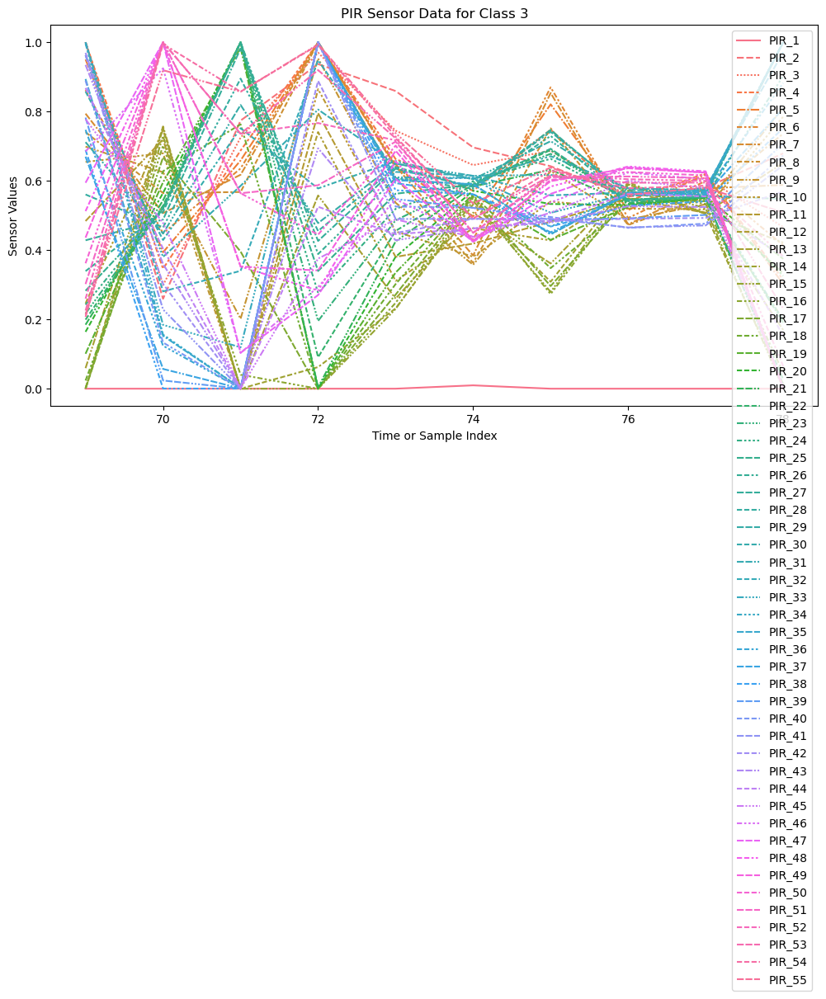

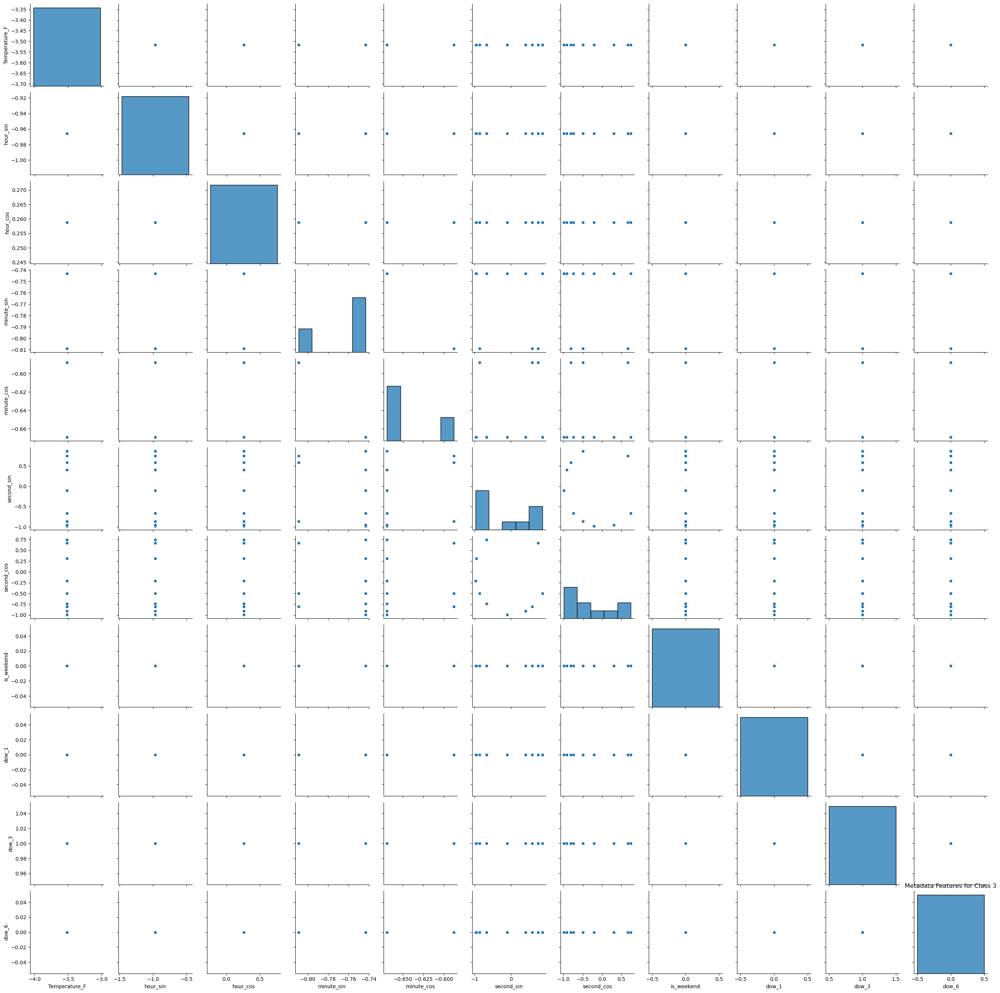

In [33]:
### Class-wise visualisations
# Filter data for class 3
class_3_data = df[df['Label'] == 3]

# Visualize PIR sensor data of class 3 (e.g., for first few sensors)
plt.figure(figsize=(12, 6))
sns.lineplot(data=class_3_data[pir_cols].iloc[:10])  # Plot for first 10 samples
plt.title('PIR Sensor Data for Class 3')
plt.xlabel('Time or Sample Index')
plt.ylabel('Sensor Values')
plt.show()

# Visualize metadata for class 3
sns.pairplot(class_3_data[other_cols].iloc[:10])  # Plot first 10 metadata samples
plt.title('Metadata Features for Class 3')
plt.show()


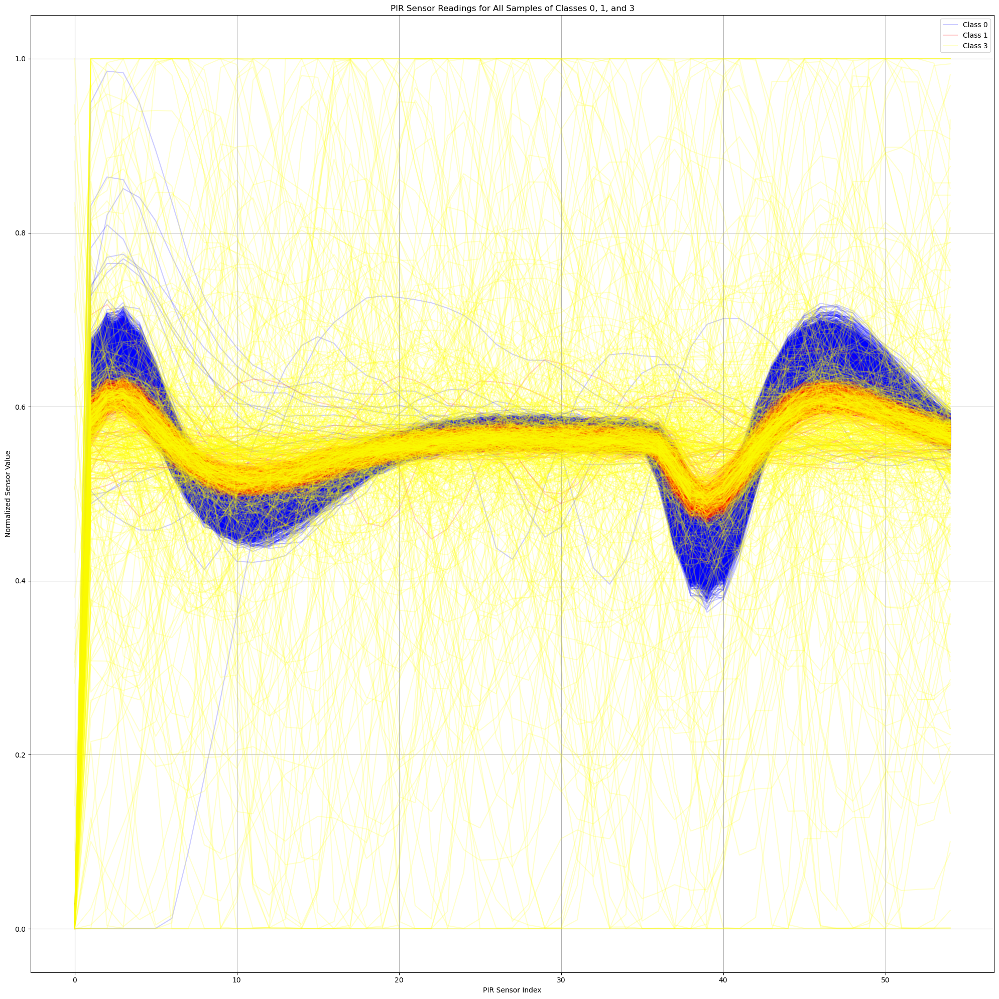

In [34]:
# Visualize PIR sensor data (all samples) for each class using Matplotlib
plt.figure(figsize=(20, 20))
# Assuming `df` is your original DataFrame and labels were encoded as `y`
# We'll create a new column for encoded label to filter data
df['encoded_label'] = le.transform(df['Label'])

# Separate data by encoded label
class_0_data = df[df['Label'] == 0]
class_1_data = df[df['Label'] == 1]
class_3_data = df[df['Label'] == 3]  # Use the right class number

# Plot class 0
for i in range(len(class_0_data)):
    plt.plot(class_0_data[pir_cols].iloc[i].values, label='Class 0' if i == 0 else "", color='blue', alpha=0.2)

# Plot class 1
for i in range(len(class_1_data)):
    plt.plot(class_1_data[pir_cols].iloc[i].values, label='Class 1' if i == 0 else "", color='red', alpha=0.2)

# Plot class 3
for i in range(len(class_3_data)):
    plt.plot(class_3_data[pir_cols].iloc[i].values, label='Class 3' if i == 0 else "", color='yellow', alpha=0.2)

plt.title('PIR Sensor Readings for All Samples of Classes 0, 1, and 3')
plt.xlabel('PIR Sensor Index')
plt.ylabel('Normalized Sensor Value')
plt.legend()
plt.grid(True)
plt.tight_layout()
plt.show()


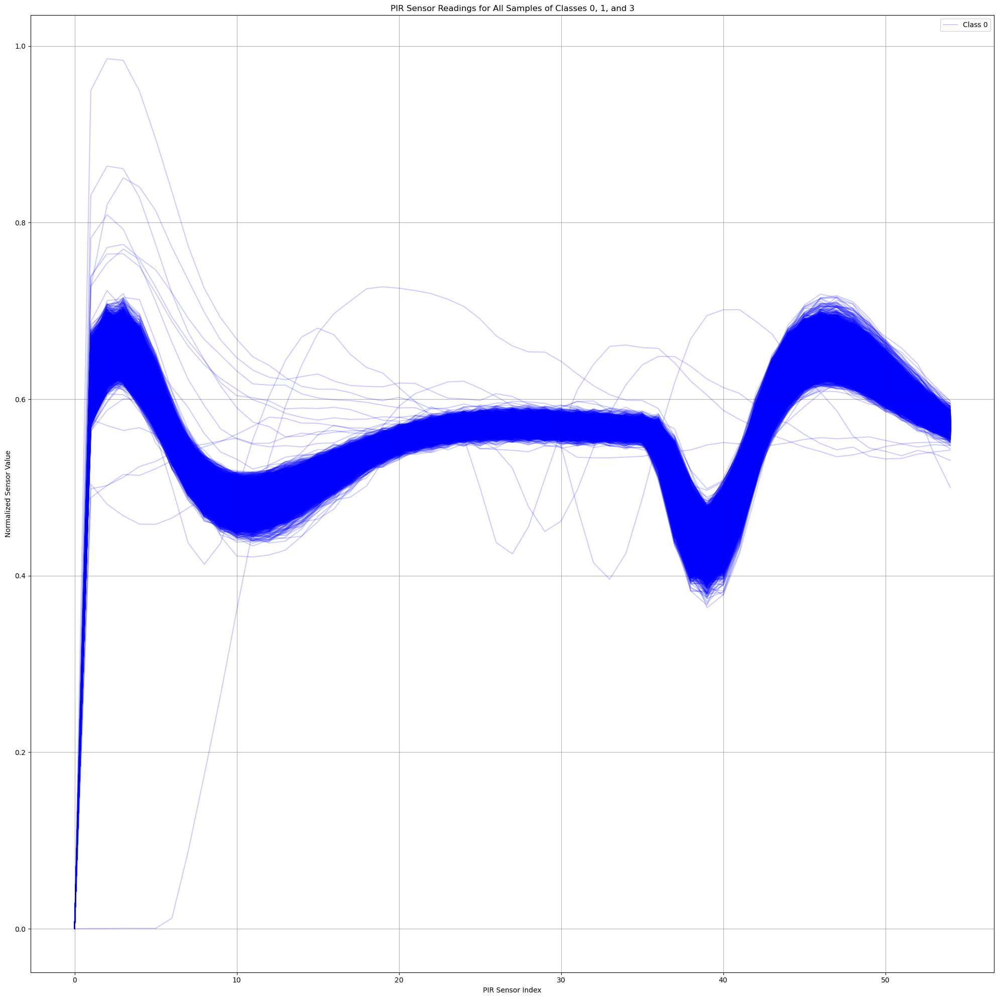

In [35]:
# Visualize PIR sensor data (all samples) for each class using Matplotlib
plt.figure(figsize=(20, 20))

# Plot class 0
for i in range(len(class_0_data)):
    plt.plot(class_0_data[pir_cols].iloc[i].values, label='Class 0' if i == 0 else "", color='blue', alpha=0.2)

plt.title('PIR Sensor Readings for All Samples of Classes 0, 1, and 3')
plt.xlabel('PIR Sensor Index')
plt.ylabel('Normalized Sensor Value')
plt.legend()
plt.grid(True)
plt.tight_layout()
plt.show()


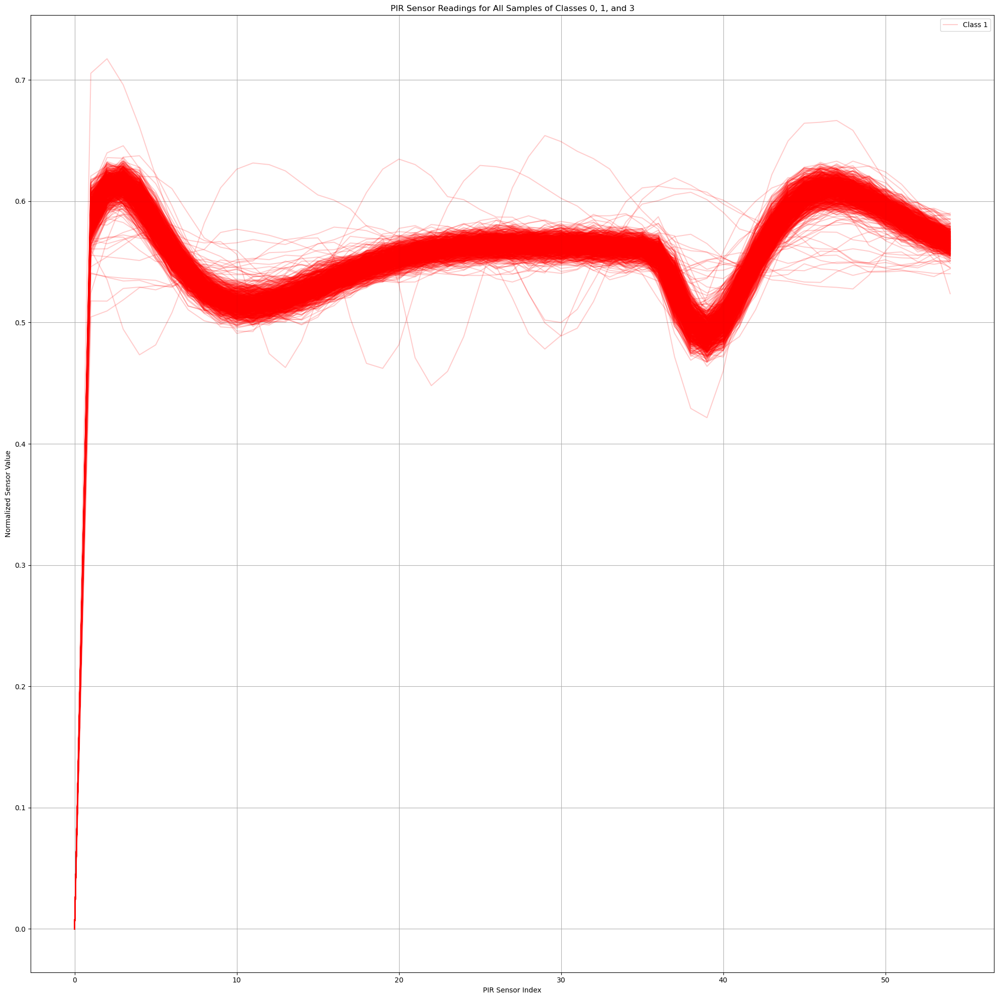

In [37]:
# Visualize PIR sensor data (all samples) for each class using Matplotlib
plt.figure(figsize=(20, 20))

# Plot class 1
for i in range(len(class_1_data)):
    plt.plot(class_1_data[pir_cols].iloc[i].values, label='Class 1' if i == 0 else "", color='red', alpha=0.2)

plt.title('PIR Sensor Readings for All Samples of Classes 0, 1, and 3')
plt.xlabel('PIR Sensor Index')
plt.ylabel('Normalized Sensor Value')
plt.legend()
plt.grid(True)
plt.tight_layout()
plt.show()


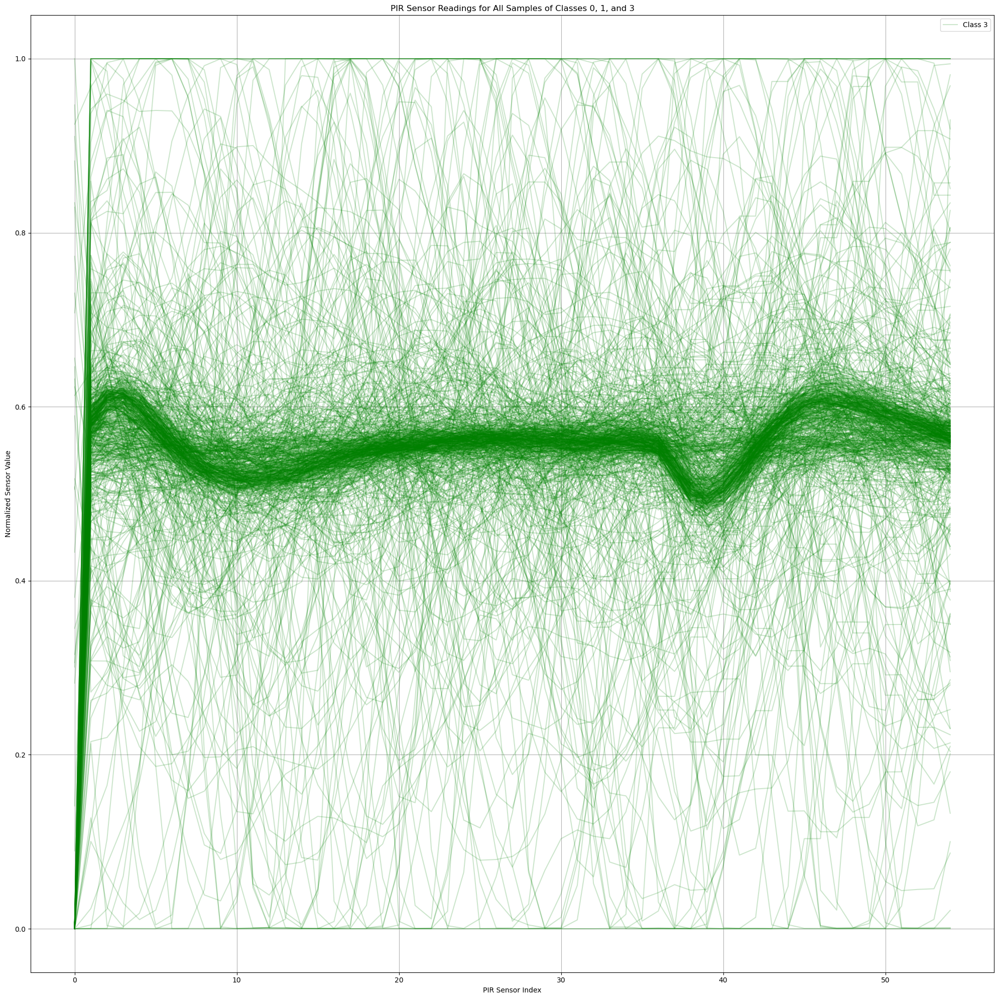

In [38]:
# Visualize PIR sensor data (all samples) for each class using Matplotlib
plt.figure(figsize=(20, 20))

# Plot class 3
for i in range(len(class_3_data)):
    plt.plot(class_3_data[pir_cols].iloc[i].values, label='Class 3' if i == 0 else "", color='green', alpha=0.2)

plt.title('PIR Sensor Readings for All Samples of Classes 0, 1, and 3')
plt.xlabel('PIR Sensor Index')
plt.ylabel('Normalized Sensor Value')
plt.legend()
plt.grid(True)
plt.tight_layout()
plt.show()


In [39]:
def evaluate_model(datafile_location, checkpoint):
    # Load model
    model = load_model(checkpoint)

    # Load and process test data
    test_df = pd.read_csv(datafile_location)
    test_df = process_datetime(test_df)

    # One-hot encoding for 'dayofweek' and align columns
    test_df = pd.get_dummies(test_df, columns=['dayofweek'], prefix='dow')
    missing_cols = set(one_hot_cols) - set(test_df.columns)
    for col in missing_cols:
        test_df[col] = 0
    test_df = test_df[meta_cols + pir_cols + ['Label']]

    # Scale PIR data
    X_test_pir = scaler_pir.transform(test_df[pir_cols])
    X_test_pir = X_test_pir.reshape(-1, len(pir_cols), 1)

    # Scale temperature and prepare meta data
    test_df['Temperature_F'] = temp_scaler.transform(test_df[['Temperature_F']])
    X_test_meta = test_df[meta_cols].astype(np.float32).values

    # Ground truth
    y_true = le.transform(test_df['Label'])

    # Predict
    y_pred_probs = model.predict([X_test_pir, X_test_meta])
    y_pred = np.argmax(y_pred_probs, axis=1)

    # Accuracy
    accuracy = accuracy_score(y_true, y_pred)
    return accuracy

In [40]:
#---------------------Change file name and corresponding checkpoint here-------------------------
evaluate_model('pirvision_office_dataset2.csv', 'checkpoints/team_36_fold1_model.h5')

240/240 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step


0.9768657691804993